## <center>**PROJECT: ```Fraud Detection Using Credit Card Transactions```**</center>

# <center>**FILE 1: ```Feature Engineering```**</center>

## **Imports**

In [1]:
import time
import numpy as np
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
from sklearn.preprocessing import MinMaxScaler
from sklearn.model_selection import  train_test_split

## **Dataset Loading**
The following Python code snippet reads data from a CSV file using the `pandas` library:

In [2]:
# Train Data
df_train = pd.read_csv('Dataset/fraudTrain.csv')
print(df_train.shape)

# Test Data
df_test = pd.read_csv('Dataset/fraudTest.csv')
print(df_test.shape)

(1296675, 23)
(555719, 23)


## **Feature Engineering**

### ```Removing Unnamed Column```

In [3]:
df_train = df_train.drop(columns=df_train.columns[df_train.columns.str.contains('Unnamed')])
df_test = df_test.drop(columns=df_test.columns[df_test.columns.str.contains('Unnamed')])

### ```Splitting datetime column into date and time columns```

In [4]:
def splitDatetime(df):
    df['Dates'] = pd.to_datetime(df['trans_date_trans_time']).dt.date
    df['Time'] = pd.to_datetime(df['trans_date_trans_time']).dt.time

    # Convert 'trans_date_trans_time' to datetime and create 'Time' column
    df['TimeConverted'] = pd.to_datetime(df['trans_date_trans_time'])

    return df

In [5]:
df_train = splitDatetime(df_train)
df_test = splitDatetime(df_test)

In [6]:
df_train.head(3)

,trans_date_trans_time,cc_num,merchant,category,amt,first,last,gender,street,city,...,job,dob,trans_num,unix_time,merch_lat,merch_long,is_fraud,Dates,Time,TimeConverted
0,2019-01-01 00:00:18,2703186189652095,"fraud_Rippin, Kub and Mann",misc_net,4.97,Jennifer,Banks,F,561 Perry Cove,Moravian Falls,...,"Psychologist, counselling",1988-03-09,0b242abb623afc578575680df30655b9,1325376018,36.011293,-82.048315,0,2019-01-01,00:00:18,2019-01-01 00:00:18
1,2019-01-01 00:00:44,630423337322,"fraud_Heller, Gutmann and Zieme",grocery_pos,107.23,Stephanie,Gill,F,43039 Riley Greens Suite 393,Orient,...,Special educational needs teacher,1978-06-21,1f76529f8574734946361c461b024d99,1325376044,49.159047,-118.186462,0,2019-01-01,00:00:44,2019-01-01 00:00:44
2,2019-01-01 00:00:51,38859492057661,fraud_Lind-Buckridge,entertainment,220.11,Edward,Sanchez,M,594 White Dale Suite 530,Malad City,...,Nature conservation officer,1962-01-19,a1a22d70485983eac12b5b88dad1cf95,1325376051,43.150704,-112.154481,0,2019-01-01,00:00:51,2019-01-01 00:00:51


### ```Analyzing and Manipulating Time Data```
 We'll create a new column representing time in minutes, and then categorize this time into 2-hour intervals which we refer to as bins.


In [7]:
def hourFeature(df):
    # Create a new column 'Hour' representing time in minutes
    df['Hour'] = df['TimeConverted'].dt.hour * 60 + df['TimeConverted'].dt.minute

    # Create bins for 2-hour intervals
    bins = range(0, 25 * 60, 2 * 60)  # Adjust the bin edges as needed

    # Cut the data into bins
    df['HourBin'] = pd.cut(df['Hour'], bins=bins, right=False)

    return df

In [8]:
df_train = hourFeature(df_train)
df_test = hourFeature(df_test)

In [9]:
# Percentages of Train set and Test set
total_count = len(df_train) + len(df_test)
train_set_percentage = len(df_train)*100/total_count
test_set_percentage = len(df_test)*100/total_count
print(train_set_percentage)
print(test_set_percentage)

69.99995681264353
30.000043187356468


### ```Splitting dataset```
Splitting dataset before normalization and advanced feature engineering to avoid data leakage

### ```Splitting train set into X_train, y_train```

In [10]:
X_train = df_train.drop('is_fraud', axis=1)
y_train = df_train['is_fraud']

### ```Splitting test set into X_test, y_test```
### ```Splitting validation set into X_val, y_val```

In [11]:
X = df_test.drop('is_fraud', axis=1)
y = df_test['is_fraud']

# Split the data into validation (70%) and test (30%)
X_val, X_test, y_val, y_test = train_test_split(X, y, test_size=0.3, random_state=42)

### ```Dropping irrelevant columns```

**Redundent & Irrelevent Time Features:** 
- ```"Dates", "trans_date_trans_time, Hour, unix_time"``` We already split trans_date_trans_time column into Time and Dates, having these additional date and time related columns might be redundant.

**Personal Information:** 
- ```"first", "last", "dob", "street", "state", "city_pop", "merch_lat", "merch_long"``` Personal information might not be relevant for fraud detection in case if we have to deploy this solution to any other places excluding the countries to which this dataset instances belong, and secondly, handling sensitive information requires careful consideration due to privacy concerns.

**Unique Irrelevent Features:**
- ```"trans_num"``` This is a unique feature (transection number) for every instance and this would be irrelevent in our case as this wont add much in prediction.

**NOTE: FURTHER DROPPING OF IRRELEVENT COLUMNS IS ALSO BEING DONE BEFORE SAVING THE FILES**

In [12]:
# List of columns to drop from training, testing, validation sets
columns_to_drop = ["Dates",'trans_date_trans_time', 'first', 'last', 'street', 'state', 'city_pop', 'dob', 'merch_lat', 'merch_long', 'gender', 'city', 'unix_time', 'trans_num', 'Hour']
# Drop columns
X_train = X_train.drop(columns=columns_to_drop, axis=1)
X_test = X_test.drop(columns=columns_to_drop, axis=1)
X_val = X_val.drop(columns=columns_to_drop, axis=1)

### ```Convert 'HourBin' column from minutes to hours```

In [13]:
X_train['HourBinHours'] = X_train['HourBin'].apply(lambda x: int(str(x).split(',')[0].lstrip('[')) / 60)
X_test['HourBinHours'] = X_test['HourBin'].apply(lambda x: int(str(x).split(',')[0].lstrip('[')) / 60)
X_val['HourBinHours'] = X_val['HourBin'].apply(lambda x: int(str(x).split(',')[0].lstrip('[')) / 60)


### ```Dropping HourBin column and keeping HourBinHours column```

In [14]:
X_train.drop(columns=['HourBin'], inplace=True)
X_test.drop(columns=['HourBin'], inplace=True)
X_val.drop(columns=['HourBin'], inplace=True)

### ```Normalization```

using MinMaxScaler() to scale following columns:
1. 'amt'
2. 'zip'
3. 'lat'
4. 'long'
5. 'HourBinHours'

Scaling Train Data

In [15]:
# Scaling amt, zip, long, lat, HourBinHours columns of training set

columns_to_scale = ['amt', 'zip', 'lat', 'long','HourBinHours']

# Create a copy of the DataFrame to avoid modifying the original
train_df_scaled = X_train.copy(deep=True)

# Initialize the StandardScaler
scaler = MinMaxScaler()

# Scale the specified columns
train_df_scaled[columns_to_scale] = scaler.fit_transform(X_train[columns_to_scale])

# Now, df_scaled contains the scaled values in the specified columns
train_df_scaled.head()

,cc_num,merchant,category,amt,zip,lat,long,job,Time,TimeConverted,HourBinHours
0,2703186189652095,"fraud_Rippin, Kub and Mann",misc_net,0.000137,0.278069,0.343968,0.864638,"Psychologist, counselling",00:00:18,2019-01-01 00:00:18,0.0
1,630423337322,"fraud_Heller, Gutmann and Zieme",grocery_pos,0.003670,0.993677,0.618450,0.485682,Special educational needs teacher,00:00:44,2019-01-01 00:00:44,0.0
2,38859492057661,fraud_Lind-Buckridge,entertainment,0.007569,0.832217,0.474727,0.546553,Nature conservation officer,00:00:51,2019-01-01 00:00:51,0.0
3,3534093764340240,"fraud_Kutch, Hermiston and Farrell",gas_transport,0.001520,0.592483,0.561509,0.548070,Patent attorney,00:01:16,2019-01-01 00:01:16,0.0
4,375534208663984,fraud_Keeling-Crist,misc_pos,0.001415,0.235227,0.394153,0.882190,Dance movement psychotherapist,00:03:06,2019-01-01 00:03:06,0.0


### ```Scaling Test Data```

In [16]:
# Scaling amt, zip, long, lat, HourBinHours columns of testing set

columns_to_scale = ['amt', 'zip', 'lat', 'long','HourBinHours']
test_df_scaled = X_test.copy(deep=True)

# Scale the specified columns
test_df_scaled[columns_to_scale] = scaler.fit_transform(X_test[columns_to_scale])

# Now, df_scaled contains the scaled values in the specified columns
test_df_scaled.head()

,cc_num,merchant,category,amt,zip,lat,long,job,Time,TimeConverted,HourBinHours
119106,377895991033232,"fraud_Bahringer, Schoen and Corkery",shopping_pos,0.000003,0.052542,0.469553,0.952674,"Librarian, academic",07:55:28,2020-08-02 07:55:28,0.272727
179292,30364087349027,"fraud_Romaguera, Wehner and Tromp",kids_pets,0.004128,0.737756,0.347383,0.712057,Fitness centre manager,14:05:16,2020-08-23 14:05:16,0.636364
540729,30328384440870,fraud_Berge-Hills,kids_pets,0.001330,0.642311,0.438035,0.742019,Cytogeneticist,16:22:29,2020-12-28 16:22:29,0.727273
374360,30364087349027,"fraud_Connelly, Reichert and Fritsch",gas_transport,0.003165,0.737756,0.347383,0.712057,Fitness centre manager,10:44:50,2020-11-14 10:44:50,0.454545
314574,4198470814557,fraud_Kuphal-Predovic,misc_net,0.000395,0.509446,0.469741,0.719607,Engineering geologist,01:50:09,2020-10-19 01:50:09,0.000000


### ```Scaling Validation Data```

In [17]:
# Scaling amt, zip, long, lat, HourBinHours columns of validation set

columns_to_scale = ['amt', 'zip', 'lat', 'long','HourBinHours']
val_df_scaled = X_val.copy(deep=True)

# Scale the specified columns
val_df_scaled[columns_to_scale] = scaler.fit_transform(X_val[columns_to_scale])

# Now, df_scaled contains the scaled values in the specified columns
val_df_scaled.head()

,cc_num,merchant,category,amt,zip,lat,long,job,Time,TimeConverted,HourBinHours
227898,565399283797,"fraud_Bernhard, Grant and Langworth",shopping_pos,0.006672,0.979618,0.500473,0.495194,Economist,00:41:38,2020-09-11 00:41:38,0.000000
526423,374656033243756,"fraud_Wuckert, Wintheiser and Friesen",home,0.001009,0.212398,0.413209,0.905722,Mudlogger,17:09:57,2020-12-25 17:09:57,0.727273
361632,4956828990005111019,fraud_Gibson-Deckow,entertainment,0.002615,0.060316,0.452176,0.935802,Operational researcher,20:43:15,2020-11-08 20:43:15,0.909091
234967,4384910379661778,fraud_Huels-Hahn,gas_transport,0.003312,0.560407,0.590209,0.708777,Naval architect,04:12:42,2020-09-14 04:12:42,0.181818
37330,340953839692349,fraud_Kemmer-Buckridge,misc_pos,0.002583,0.474651,0.492508,0.846167,"Doctor, hospital",13:18:11,2020-07-04 13:18:11,0.545455


### ```Converting splitted and normalized datasets into parquet files```

In [18]:
# concatinating X_train and y_train df
y_train_df = y_train.to_frame() # converting series into df (to ease concatination)

train_df = pd.concat([train_df_scaled, y_train_df], axis=1, join='inner')

In [19]:
# concatinating X_train and y_train df
y_test_df = y_test.to_frame() # converting series into df (to ease concatination)

test_df = pd.concat([test_df_scaled, y_test_df], axis=1, join='inner')

In [20]:
# concatinating X_train and y_train df
y_val_df = y_val.to_frame() # converting series into df (to ease concatination)

valid_df = pd.concat([val_df_scaled, y_val_df], axis=1, join='inner')

In [21]:
print(train_df.shape)
print(valid_df.shape)
print(test_df.shape)

(1296675, 12)
(389003, 12)
(166716, 12)


In [22]:
train_df.head(3)

,cc_num,merchant,category,amt,zip,lat,long,job,Time,TimeConverted,HourBinHours,is_fraud
0,2703186189652095,"fraud_Rippin, Kub and Mann",misc_net,0.000137,0.278069,0.343968,0.864638,"Psychologist, counselling",00:00:18,2019-01-01 00:00:18,0.0,0
1,630423337322,"fraud_Heller, Gutmann and Zieme",grocery_pos,0.003670,0.993677,0.618450,0.485682,Special educational needs teacher,00:00:44,2019-01-01 00:00:44,0.0,0
2,38859492057661,fraud_Lind-Buckridge,entertainment,0.007569,0.832217,0.474727,0.546553,Nature conservation officer,00:00:51,2019-01-01 00:00:51,0.0,0


In [23]:
valid_df.head(3)

,cc_num,merchant,category,amt,zip,lat,long,job,Time,TimeConverted,HourBinHours,is_fraud
227898,565399283797,"fraud_Bernhard, Grant and Langworth",shopping_pos,0.006672,0.979618,0.500473,0.495194,Economist,00:41:38,2020-09-11 00:41:38,0.000000,0
526423,374656033243756,"fraud_Wuckert, Wintheiser and Friesen",home,0.001009,0.212398,0.413209,0.905722,Mudlogger,17:09:57,2020-12-25 17:09:57,0.727273,0
361632,4956828990005111019,fraud_Gibson-Deckow,entertainment,0.002615,0.060316,0.452176,0.935802,Operational researcher,20:43:15,2020-11-08 20:43:15,0.909091,0


In [24]:
test_df.head(3)

,cc_num,merchant,category,amt,zip,lat,long,job,Time,TimeConverted,HourBinHours,is_fraud
119106,377895991033232,"fraud_Bahringer, Schoen and Corkery",shopping_pos,0.000003,0.052542,0.469553,0.952674,"Librarian, academic",07:55:28,2020-08-02 07:55:28,0.272727,0
179292,30364087349027,"fraud_Romaguera, Wehner and Tromp",kids_pets,0.004128,0.737756,0.347383,0.712057,Fitness centre manager,14:05:16,2020-08-23 14:05:16,0.636364,0
540729,30328384440870,fraud_Berge-Hills,kids_pets,0.001330,0.642311,0.438035,0.742019,Cytogeneticist,16:22:29,2020-12-28 16:22:29,0.727273,0


## **Advance Feature Engineering**

### ```Analyzing Fraud Ratio for Merchants```

Let's create a function to analyze the fraud ratio for different merchants in a given DataFrame.


In [25]:
def Merchant_ratio_feature_info(df):
    unique_merchant_count = df["merchant"].nunique()
    print(f"Number of unique merchants: {unique_merchant_count}")

    # Replace 'feature_name' with the actual name of your feature
    feature_name = 'merchant'

    # Calculate the total number of transactions for each merchant
    total_transactions = df[feature_name].value_counts()

    # Calculate the number of fraud transactions for each merchant
    fraud_transactions = df[df['is_fraud'] == 1][feature_name].value_counts()

    # Calculate the fraud ratio for each merchant
    fraud_ratio = fraud_transactions / total_transactions

    # Create a bar plot to visualize the fraud ratio for each merchant
    plt.figure(figsize=(200, 6))
    fraud_ratio.plot(kind='bar', color='coral')
    plt.title(f'Fraud Ratio at Each {feature_name}')
    plt.xlabel(feature_name)
    plt.ylabel('Fraud Ratio')
    plt.xticks(rotation=45, ha='right')  # Rotate x-axis labels for better visibility

    return plt.show()

### ```Calculating Fraud Ratio for Merchants and Appending to DataFrame```

Let's create a function that calculates the fraud ratio for each merchant and appends the result as a new feature to the original DataFrame.


In [26]:
def Fraud_ratio_merchant_append_to_df(df):
    # Replace 'feature_name' with the actual name of your feature
    feature_name = 'merchant'

    # Calculate the total number of transactions for each merchant
    total_transactions = df[feature_name].value_counts()

    # Calculate the number of fraud transactions for each merchant
    fraud_transactions = df[df['is_fraud'] == 1][feature_name].value_counts()

    # Calculate the fraud ratio for each merchant
    fraud_ratio = fraud_transactions / total_transactions

    # Create a new DataFrame with fraud ratio as a feature
    fraud_ratio_df = pd.DataFrame({'Fraud_Ratio_at_merchant': fraud_ratio})

    # Merge the new DataFrame with the original DataFrame based on the merchant column
    df = pd.merge(df, fraud_ratio_df, left_on=feature_name, right_index=True, how='left')

    return df

### ```Analyzing Fraud Ratio for Categories```

Let's create a function to analyze the fraud ratio for different categories in a given DataFrame.


In [27]:
def Category_ratio_feature_info(df):
    unique_category_count = df["category"].nunique()
    print(f"Number of unique category: {unique_category_count}")

    # Replace 'feature_name' with the actual name of your feature
    feature_name = 'category'

    # Calculate the total number of transactions for each category
    total_transactions = df[feature_name].value_counts()

    # Calculate the number of fraud transactions for each category
    fraud_transactions = df[df['is_fraud'] == 1][feature_name].value_counts()

    # Calculate the fraud ratio for each category
    fraud_ratio = fraud_transactions / total_transactions

    # Create a bar plot to visualize the fraud ratio for each category
    plt.figure(figsize=(16, 6))
    fraud_ratio.plot(kind='bar', color='coral')
    plt.title(f'Fraud Ratio at Each {feature_name}')
    plt.xlabel(feature_name)
    plt.ylabel('Fraud Ratio')
    plt.xticks(rotation=45, ha='right')  # Rotate x-axis labels for better visibility

    return plt.show()

### ```Calculating Fraud Ratio for Categories and Appending to DataFrame```

Let's create a function that calculates the fraud ratio for each category and appends the result as a new feature to the original DataFrame.


In [28]:
def Fraud_ratio_category_append_to_df(df):
    # Replace 'feature_name' with the actual name of your feature
    feature_name = 'category'

    # Calculate the total number of transactions for each category
    total_transactions = df[feature_name].value_counts()

    # Calculate the number of fraud transactions for each category
    fraud_transactions = df[df['is_fraud'] == 1][feature_name].value_counts()

    # Calculate the fraud ratio for each category
    fraud_ratio = fraud_transactions / total_transactions

    # Create a new DataFrame with fraud ratio as a feature
    fraud_ratio_df = pd.DataFrame({'Fraud_Ratio_at_category': fraud_ratio})

    # Merge the new DataFrame with the original DataFrame based on the category column
    df = pd.merge(df, fraud_ratio_df, left_on=feature_name, right_index=True, how='left')

    return df


### ```Analyzing Fraud Ratio for Jobs```

Let's create a function to analyze the fraud ratio for different jobs in a given DataFrame.


In [29]:
def Job_ratio_feature_info(df):
    job_count = df["job"].nunique()
    print(f"Total Number of Jobs: {job_count}")

    # Replace 'feature_name' with the actual name of your feature
    feature_name = 'job'

    # Calculate the total number of transactions for each job
    total_transactions = df[feature_name].value_counts()

    # Calculate the number of fraud transactions for each job
    fraud_transactions = df[df['is_fraud'] == 1][feature_name].value_counts()

    # Calculate the fraud ratio for each job
    fraud_ratio = fraud_transactions / total_transactions

    # Create a bar plot to visualize the fraud ratio for each job
    plt.figure(figsize=(200, 6))
    fraud_ratio.plot(kind='bar', color='coral')
    plt.title(f'Fraud Ratio at Each {feature_name}')
    plt.xlabel(feature_name)
    plt.ylabel('Fraud Ratio')
    plt.xticks(rotation=45, ha='right')  # Rotate x-axis labels for better visibility

    return plt.show()

### ```Calculating Fraud Ratio for Jobs and Appending to DataFrame```

Let's create a function that calculates the fraud ratio for each job and appends the result as a new feature to the original DataFrame.


In [30]:
def Fraud_ratio_job_append_to_df(df):
    # Replace 'feature_name' with the actual name of your feature
    feature_name = 'job'

    # Calculate the total number of transactions for each job
    total_transactions = df[feature_name].value_counts()

    # Calculate the number of fraud transactions for each job
    fraud_transactions = df[df['is_fraud'] == 1][feature_name].value_counts()

    # Calculate the fraud ratio for each job
    fraud_ratio = fraud_transactions / total_transactions

    # Create a new DataFrame with fraud ratio as a feature
    fraud_ratio_df = pd.DataFrame({'Fraud_Ratio_at_job': fraud_ratio})

    # Merge the new DataFrame with the original DataFrame based on the job column
    df = pd.merge(df, fraud_ratio_df, left_on=feature_name, right_index=True, how='left')

    return df

### ```Adding Time-based Features to DataFrame```

Let's create a function that adds time-related features to a DataFrame. In this code, we'll add features for recency and frequency based on the 'Time' column.


In [31]:
def Time_freq_ratio_merchant_append_to_df(df):

    df['TimeConverted'] = pd.to_datetime(df['TimeConverted'])

    # Feature 1: Recency (how long ago the transaction took place based on the previous transaction for each cc_num)
    df['Recency'] = df.groupby('cc_num')['TimeConverted'].diff().dt.total_seconds() / (60 * 60 * 24)

    # Feature 2: Frequency (number of transactions per unit time)
    df['Frequency'] = 1  
    df['Frequency'] = df.groupby('cc_num')['Frequency'].transform('cumsum')

    return df

### ```Removing Null values if any(EDA)```

In [32]:
def removing_null_values(df):
    df = df.dropna(subset=['Fraud_Ratio_at_merchant'])

    # Specify the columns with missing values
    columns_with_missing_values = ['Fraud_Ratio_at_job', 'Recency']

    # Check if 'is_fraud' is 0 for rows with missing values and drop them
    for column in columns_with_missing_values:
        mask = (df[column].isna()) & (df['is_fraud'] == 0)
        df = df[~mask]

    # Display the number of missing values in each column
    missing_values = df.isnull().sum()

    # Display columns with missing values
    columns_with_missing_values = missing_values[missing_values > 0]

    # Display the result
    print("Number of missing values in each column:")
    print(missing_values)

    return df

## **Visualization Contd:** 

### ```Training set function implementation```

Number of unique merchants: 693


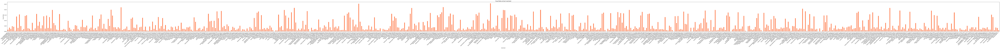

Number of unique category: 14


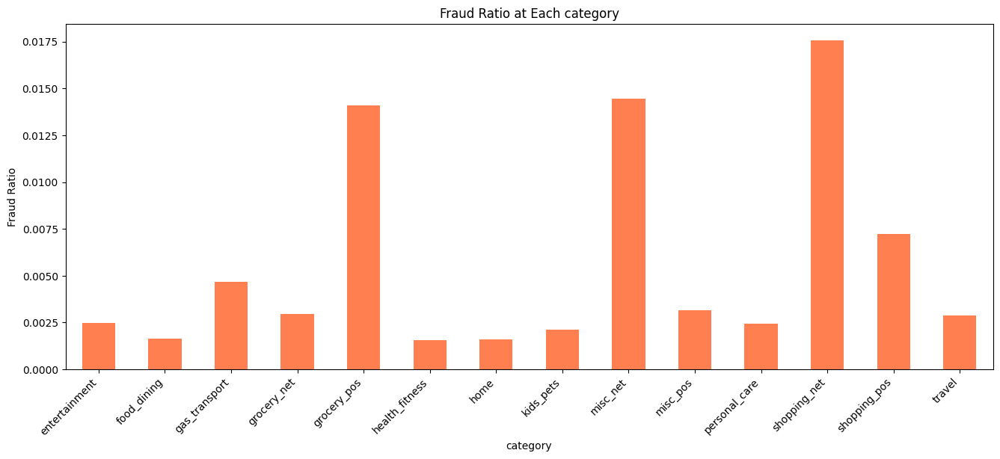

Total Number of Jobs: 494


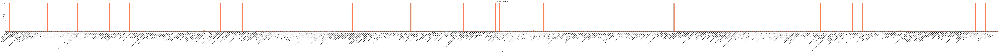

In [33]:
Merchant_ratio_feature_info(train_df)
finalized_df_train = Fraud_ratio_merchant_append_to_df(train_df)
Category_ratio_feature_info(train_df)
finalized_df_train = Fraud_ratio_category_append_to_df(finalized_df_train)
Job_ratio_feature_info(train_df)
finalized_df_train = Fraud_ratio_job_append_to_df(finalized_df_train)
finalized_df_train = Time_freq_ratio_merchant_append_to_df(finalized_df_train)

In [34]:
finalized_df_train.head(3)

,cc_num,merchant,category,amt,zip,lat,long,job,Time,TimeConverted,HourBinHours,is_fraud,Fraud_Ratio_at_merchant,Fraud_Ratio_at_category,Fraud_Ratio_at_job,Recency,Frequency
0,2703186189652095,"fraud_Rippin, Kub and Mann",misc_net,0.000137,0.278069,0.343968,0.864638,"Psychologist, counselling",00:00:18,2019-01-01 00:00:18,0.0,0,0.014207,0.014458,0.001693,NaN,1
1,630423337322,"fraud_Heller, Gutmann and Zieme",grocery_pos,0.003670,0.993677,0.618450,0.485682,Special educational needs teacher,00:00:44,2019-01-01 00:00:44,0.0,0,0.010787,0.014098,0.002157,NaN,1
2,38859492057661,fraud_Lind-Buckridge,entertainment,0.007569,0.832217,0.474727,0.546553,Nature conservation officer,00:00:51,2019-01-01 00:00:51,0.0,0,0.002111,0.002478,0.015656,NaN,1


In [35]:
finalized_df_train = removing_null_values(finalized_df_train)

Number of missing values in each column:
cc_num                      0
merchant                    0
category                    0
amt                         0
zip                         0
lat                         0
long                        0
job                         0
Time                        0
TimeConverted               0
HourBinHours                0
is_fraud                    0
Fraud_Ratio_at_merchant     0
Fraud_Ratio_at_category     0
Fraud_Ratio_at_job          0
Recency                    75
Frequency                   0
dtype: int64


In [36]:
# Removing remaining values left from Fraud == 1 Values
finalized_df_train = finalized_df_train.dropna(subset=['Recency'])

### ```Column Dropping Contd: ```
cc_num, merchant, category, job, TimeConverted and Time are irrelevent for further use due to the fact that we have utilized their combinations to engineer better features. Furthermore, cc_num (credit card number) is itself cannot be considered a good feature because its not logical to have predictions on your credit card number.

In [37]:
# Finalized Columns
# List of columns to drop
columns_to_drop = ["cc_num", "merchant", "category", "job", "TimeConverted", "Time"]
# Drop columns
finalized_df_train = finalized_df_train.drop(columns=columns_to_drop, axis=1)

In [38]:
finalized_df_train.head(3)

,amt,zip,lat,long,HourBinHours,is_fraud,Fraud_Ratio_at_merchant,Fraud_Ratio_at_category,Fraud_Ratio_at_job,Recency,Frequency
43,0.007315,0.675903,0.384990,0.661908,0.0,0,0.014446,0.014098,0.007417,0.019132,2
59,0.006100,0.845290,0.406564,0.573641,0.0,0,0.012149,0.014458,0.005492,0.006875,2
87,0.002193,0.150123,0.450435,0.878650,0.0,0,0.005684,0.004694,0.007905,0.004641,2


### ```Validation set function implementation```

Number of unique merchants: 693


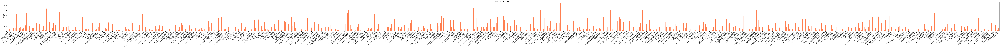

Number of unique category: 14


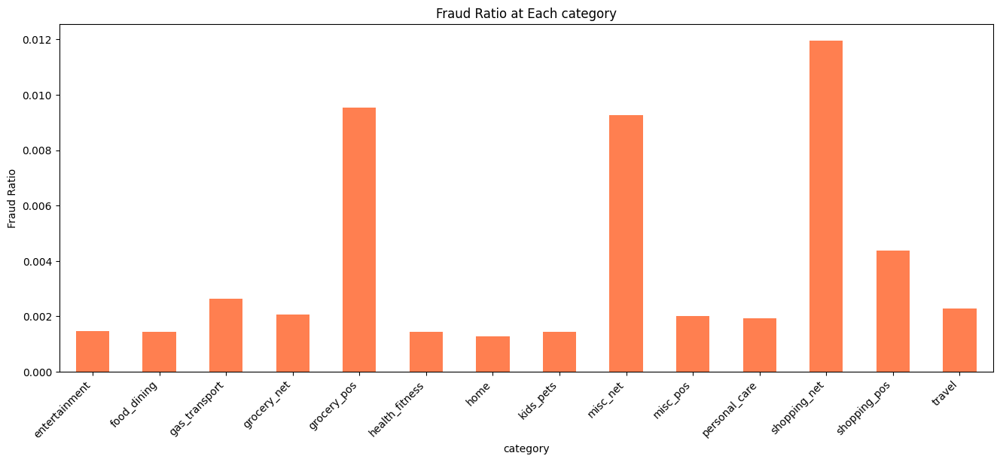

Total Number of Jobs: 478


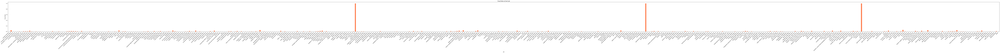

In [39]:
Merchant_ratio_feature_info(valid_df)
finalized_df_valid = Fraud_ratio_merchant_append_to_df(valid_df)
Category_ratio_feature_info(valid_df)
finalized_df_valid = Fraud_ratio_category_append_to_df(finalized_df_valid)
Job_ratio_feature_info(valid_df)
finalized_df_valid = Fraud_ratio_job_append_to_df(finalized_df_valid)
finalized_df_valid = Time_freq_ratio_merchant_append_to_df(finalized_df_valid)

In [40]:
finalized_df_valid.head(3)

,cc_num,merchant,category,amt,zip,lat,long,job,Time,TimeConverted,HourBinHours,is_fraud,Fraud_Ratio_at_merchant,Fraud_Ratio_at_category,Fraud_Ratio_at_job,Recency,Frequency
227898,565399283797,"fraud_Bernhard, Grant and Langworth",shopping_pos,0.006672,0.979618,0.500473,0.495194,Economist,00:41:38,2020-09-11 00:41:38,0.000000,0,0.001479,0.004363,NaN,NaN,1
526423,374656033243756,"fraud_Wuckert, Wintheiser and Friesen",home,0.001009,0.212398,0.413209,0.905722,Mudlogger,17:09:57,2020-12-25 17:09:57,0.727273,0,0.004127,0.001285,NaN,NaN,1
361632,4956828990005111019,fraud_Gibson-Deckow,entertainment,0.002615,0.060316,0.452176,0.935802,Operational researcher,20:43:15,2020-11-08 20:43:15,0.909091,0,0.003960,0.001465,NaN,NaN,1


In [41]:
finalized_df_valid = removing_null_values(finalized_df_valid)

Number of missing values in each column:
cc_num                      0
merchant                    0
category                    0
amt                         0
zip                         0
lat                         0
long                        0
job                         0
Time                        0
TimeConverted               0
HourBinHours                0
is_fraud                    0
Fraud_Ratio_at_merchant     0
Fraud_Ratio_at_category     0
Fraud_Ratio_at_job          0
Recency                    19
Frequency                   0
dtype: int64


In [42]:
# Removing remaining values left from Fraud == 1 Values
finalized_df_valid = finalized_df_valid.dropna(subset=['Recency'])

In [43]:
# Finalized Columns
# List of columns to drop
columns_to_drop = ["cc_num", "merchant", "category", "job", "TimeConverted", "Time"]
# Drop columns
finalized_df_valid = finalized_df_valid.drop(columns=columns_to_drop, axis=1)

In [44]:
finalized_df_valid.head(3)

,amt,zip,lat,long,HourBinHours,is_fraud,Fraud_Ratio_at_merchant,Fraud_Ratio_at_category,Fraud_Ratio_at_job,Recency,Frequency
406548,0.001421,0.748348,0.298057,0.706636,0.818182,0,0.003407,0.001932,0.009325,102.064456,2
59939,0.002938,0.106817,0.453430,0.947303,0.454545,0,0.011070,0.002059,0.002796,-89.493090,2
79410,0.002889,0.627118,0.407115,0.769754,0.272727,0,0.001701,0.001465,0.004430,9.281586,2


### ```Test set function implementation```

Number of unique merchants: 693


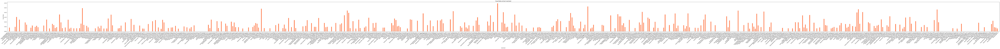

Number of unique category: 14


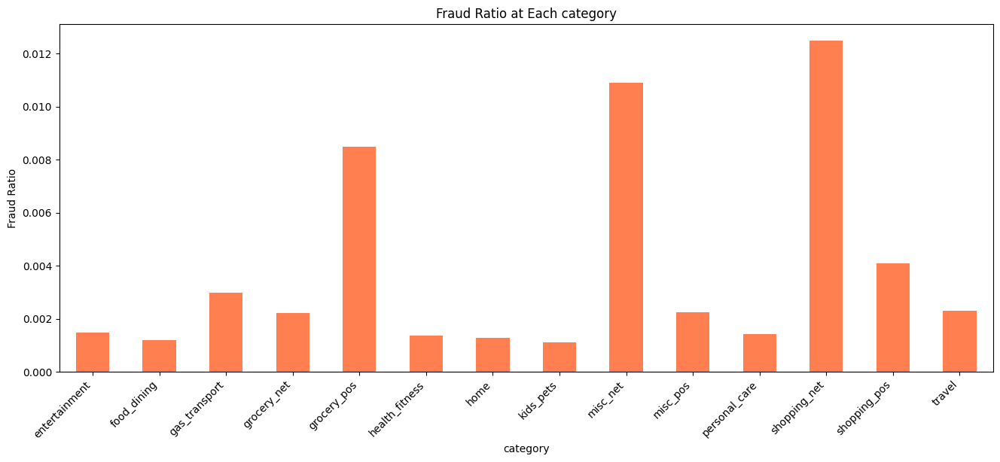

Total Number of Jobs: 478


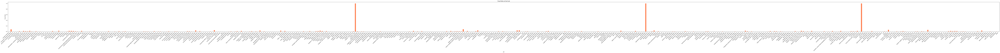

In [45]:
Merchant_ratio_feature_info(test_df)
finalized_df_test = Fraud_ratio_merchant_append_to_df(test_df)
Category_ratio_feature_info(test_df)
finalized_df_test = Fraud_ratio_category_append_to_df(finalized_df_test)
Job_ratio_feature_info(test_df)
finalized_df_test = Fraud_ratio_job_append_to_df(finalized_df_test)
finalized_df_test = Time_freq_ratio_merchant_append_to_df(finalized_df_test)

In [46]:
finalized_df_test.head(3)

,cc_num,merchant,category,amt,zip,lat,long,job,Time,TimeConverted,HourBinHours,is_fraud,Fraud_Ratio_at_merchant,Fraud_Ratio_at_category,Fraud_Ratio_at_job,Recency,Frequency
119106,377895991033232,"fraud_Bahringer, Schoen and Corkery",shopping_pos,0.000003,0.052542,0.469553,0.952674,"Librarian, academic",07:55:28,2020-08-02 07:55:28,0.272727,0,0.006154,0.004079,NaN,NaN,1
179292,30364087349027,"fraud_Romaguera, Wehner and Tromp",kids_pets,0.004128,0.737756,0.347383,0.712057,Fitness centre manager,14:05:16,2020-08-23 14:05:16,0.636364,0,NaN,0.001105,NaN,NaN,1
540729,30328384440870,fraud_Berge-Hills,kids_pets,0.001330,0.642311,0.438035,0.742019,Cytogeneticist,16:22:29,2020-12-28 16:22:29,0.727273,0,NaN,0.001105,0.004559,NaN,1


In [47]:
finalized_df_test = removing_null_values(finalized_df_test)

Number of missing values in each column:
cc_num                      0
merchant                    0
category                    0
amt                         0
zip                         0
lat                         0
long                        0
job                         0
Time                        0
TimeConverted               0
HourBinHours                0
is_fraud                    0
Fraud_Ratio_at_merchant     0
Fraud_Ratio_at_category     0
Fraud_Ratio_at_job          0
Recency                    20
Frequency                   0
dtype: int64


In [48]:
# Removing remaining values left from Fraud == 1 Values
finalized_df_test = finalized_df_test.dropna(subset=['Recency'])

In [49]:
# Finalized Columns
# List of columns to drop
columns_to_drop = ["cc_num", "merchant", "category", "job", "TimeConverted", "Time"]
# Drop columns
finalized_df_test = finalized_df_test.drop(columns=columns_to_drop, axis=1)

In [50]:
finalized_df_test.head(3)

,amt,zip,lat,long,HourBinHours,is_fraud,Fraud_Ratio_at_merchant,Fraud_Ratio_at_category,Fraud_Ratio_at_job,Recency,Frequency
432005,0.000570,0.460604,0.456273,0.819320,1.000000,0,0.003891,0.001486,0.007491,124.666019,2
348960,0.002706,0.275156,0.311807,0.898521,0.909091,0,0.004545,0.001365,0.003929,50.017662,2
532848,0.002417,0.945755,0.394608,0.444994,0.272727,0,0.008772,0.002230,0.005814,6.725278,3


## **Saving Finalized Files** 

In [51]:
finalized_df_train.to_csv("train_data.csv")
finalized_df_test.to_csv("test_data.csv")
finalized_df_valid.to_csv("val_data.csv")

## **Summary**
### ```Feature Selection and Engineering Overview```
We chose merchants involved in fraudulent activity based on the scale of 0-1 for merchant, category, and job features concerning the total transactions. To circumvent the use of categorical data and prevent an undesirable increase in the total number of columns to 1200, we combined these features. Following this, we normalized zip, lat, and long to a 0-1 range using the min/max function to prevent large values during model training.

Additionally, we incorporated features for Hour Bin, recency, and frequency based on the 'Time' column to utilize the time feature, which was originally a categorical column.